# Рынок заведений общественного питания Москвы

**Цель исследования** – проанализировать рынок заведений общественного питания Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Ход исследования**:
1. Ознакомимся с датасетом
2. Выполним предобработку данных
3. Сделаем анализ данных
4. Детализируем исследование: открытие кофейни
5. Сделаем презентацию

**Описание данных:**

*Файл /moscow_places.csv (информация о заведениях общественного питания Москвы)*\

`name` — название заведения;\
`address` — адрес заведения;\
`category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;\
`hours` — информация о днях и часах работы;\
`lat` — широта географической точки, в которой находится заведение;\
`lng` — долгота географической точки, в которой находится заведение;\
`rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);\
`price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;\
`avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона;\
`middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
* Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
* Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
* Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт;

`middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
* Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
* Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
* Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт;

`chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым;\
`district` — административный район, в котором находится заведение, например Центральный административный округ;\
`seats` — количество посадочных мест.


In [1]:
# импортируем библиотеки
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
from scipy import stats as st
import folium
from folium import Map, Choropleth
from folium import Marker
from folium.plugins import MarkerCluster
import warnings
warnings.filterwarnings("ignore")

## Откроем таблицу и изучим общую информацию о данных

In [2]:
# сохраним датасет в переменную
df = pd.read_csv('/datasets/moscow_places.csv')
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
# посмотрим на общую информацию о датафрейме
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


- В датасете 8406 строк
- В целом все типы данных соответствуют категориям, правда, столбец seats можно было бы поменять на целочисленный, но для анализа это не так важно. Никаких критических ошибок в типах данных нет
- Очень много пропусков, причем достаточно большую часть из них заполнить не представляется возможным

## Выполним предобработку данных

### Пропуски

In [4]:
# посмотрим на количество пропусков
df.isnull().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

- Больше всего пропусков мы наблюдаем в столбцах price, middle_avg_bill, middle_coffee_cup, avg_bill. Эти столбцы взаимосвязаны: столбцы middle_avg_bill, middle_coffee_cup напрямую зависят от того, что написано в avg_bill, то есть пропуски в avg_bill тянут за собой пропуски в middle_avg_bill и middle_coffee_cup. Также стоит отметить, что у кофеен не будет записей в middle_avg_bill, а у кафе и ресторанов не будет записей в middle_coffee_cup    
- Есть пропуски в столбце seats
- Есть пропуски в столбце hours

### Дубликаты

In [5]:
# проверка на явные дубликаты
df.duplicated().sum()

0

Явных дубликатов нет, это хорошо. 

### Устранение ошибок в сетевых/несетевых местах

Пока мы не удалили значения, разберемся с правильным отображением сетевого/несетевого заведения в столбце chain. Для этого:
- сначала сделаем датафрейм с количеством заведений каждого наименования в столбце total
- совместим датафреймы (количество заведений нам пригодится дальше в проекте)
- если total > 1, то заведение сетевое, и наоборот

In [6]:
# сначала сделаем датафрейм, куда запишем количество заведений каждого наименования
total_spots = df.groupby(['name']).agg({'name': 'count'}).rename(columns={'name':'total'}).reset_index()
total_spots

,name,total
0,#КешбэкКафе,1
1,+39 Pizzeria Mozzarella bar,1
2,1 Этаж,1
3,1-я Креветочная,1
4,10 Идеальных Пицц,3
...,...,...
5609,Яръ,1
5610,Ясмин,1
5611,Ясно,1
5612,Яуза,1


In [7]:
new_df = pd.merge(total_spots, df, on=['name'], how='right')
new_df.head()

,name,total,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,1,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,1,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,1,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,1,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,2,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [8]:
# исключим из выдачи заведения с этими названиями
new_df = new_df.loc[(new_df['name'] != 'Кафе')\
                    & (new_df['name'] != 'Ресторан')\
                    & (new_df['name'] != 'Столовая')\
                    & (new_df['name'] != 'Шаурма')]

In [9]:
# сделаем цикл, где будем сравнивать значения
for i in new_df.index:
    if new_df.loc[i,'total'] > 1:
        new_df.loc[i,'chain'] = 1
        new_df.loc[i,'chain'] = 'сетевое'
    else:
        new_df.loc[i,'chain'] = 0
        new_df.loc[i,'chain'] = 'несетевое'

In [10]:
# небольшая проверка (потому что на одном из этапов проекта здесь было замечено несоответствие)
display(new_df[new_df['name'] == 'Баку'])

,name,total,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2879,Баку,1,кафе,"Москва, Монтажная улица, 9, стр. 1",Восточный административный округ,"ежедневно, круглосуточно",55.814241,37.772411,4.9,NaN,NaN,NaN,NaN,несетевое,75.0


Все, теперь ошибок во флажках с сетевым/несетевым заведением нет. 

### Посадочные места

In [11]:
# подробнее посмотрим на столбец с посадочными местами
new_df['seats'].describe()

count    4652.000000
mean      109.349742
std       123.726217
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

- Есть заведения с 0 посадочных мест
- Есть заведения аж с 1288 посадочных мест, что выглядит не очень правдоподобно. Конечно, это могут быть рестораны с большими банкетными залами, но все равно выглядит странно

In [12]:
# посмотрим, в каких заведениях у нас отсутствуют посадочные места
display(new_df[new_df['seats'] == 0][['name','category']].head(20))

,name,category
84,Meat Doner Kebab,булочная
177,Арамье,булочная
196,Донер-Шашлык,ресторан
203,Тандыр № 1,кафе
211,Неаполитан пицца,кафе
266,Пекарня&Донер,булочная
284,Центр Плов,кафе
306,Everest Coffee,кофейня
337,Пекарня Маковка,пиццерия
424,Паб 28/13,"бар,паб"


В основном это заведения с продукцией навынос, ларьки с шавермой/шашлыком, кофейни - в них действительно может не быть посадочных мест, это не выглядит аномалией. 

Теперь проверим, в каких заведениях больше 1000 посадочных мест.

In [13]:
# посмотрим, в каких заведениях у нас посадочных мест больше тысячи
display(new_df[new_df['seats'] > 1000].head(20))

,name,total,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2713,Ваня и Гоги,1,"бар,паб","Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"ежедневно, 11:00–06:00",55.789842,37.750282,4.2,высокие,Средний счёт:1000–2500 ₽,1750.0,NaN,несетевое,1040.0
2722,Маргарита,2,быстрое питание,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"ежедневно, 10:00–22:00",55.789527,37.752004,4.3,NaN,NaN,NaN,NaN,сетевое,1040.0
2770,Шоколадница,120,кофейня,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"пн-ср 11:00–23:00; чт 11:00–00:00; пт,сб 11:00...",55.789903,37.749822,4.1,NaN,NaN,NaN,NaN,сетевое,1040.0
2966,Матрешка,1,кафе,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,NaN,55.789867,37.749656,4.0,NaN,NaN,NaN,NaN,несетевое,1040.0
4231,РестоБар Argomento,1,столовая,"Москва, Кутузовский проспект, 41, стр. 1",Западный административный округ,"ежедневно, 12:00–23:00",55.738237,37.531819,4.2,высокие,Средний счёт:2500–5000 ₽,3750.0,NaN,несетевое,1200.0
6518,DelonixCafe,1,ресторан,"Москва, проспект Вернадского, 94, корп. 1",Западный административный округ,"ежедневно, круглосуточно",55.652577,37.475730,4.1,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,несетевое,1288.0
6524,Ян Примус,3,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.657166,37.481519,4.5,выше среднего,Средний счёт:1500 ₽,1500.0,NaN,сетевое,1288.0
6574,Мюнгер,2,пиццерия,"Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.667505,37.491001,4.8,NaN,NaN,NaN,NaN,сетевое,1288.0
6641,One Price Coffee,71,кофейня,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,"ежедневно, 08:30–20:00",55.665129,37.478635,4.3,NaN,NaN,NaN,NaN,сетевое,1288.0
6658,ГудБар,1,"бар,паб","Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 11:00–23:00; сб,вс 13:00–23:00",55.667327,37.490601,4.1,средние,Средний счёт:700 ₽,700.0,NaN,несетевое,1288.0


- Тут интересно, что все заведения с 1288 местами находятся на одной и той же улице, это может быть ошибкой при ручном внесении данных
- Сюда же странным образом затесалась Яндекс Лавка, где, по идее, вообще не должно быть посадочных мест. Также Лавка находится в категории "ресторан" что не совсем соответствует действительности. Возможно, лучшим вариантом было бы вообще удалить Лавку, но пока этого делать не будем
- Теперь нам еще надо держать в уме, что в датасете могут быть неточности по аналогии с Лавкой, которую мы заметили случайно. По всей видимости, такие неточности можно было бы обработать вручную, но это повлечет за собой большие временные затраты. Возможно, для такого объемного датасета существующие неточности будут некритичны

In [14]:
# еще раз посмотрим на Лавки
display(new_df[new_df['name'] == 'Яндекс Лавка'].head())

,name,total,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
162,Яндекс Лавка,69,ресторан,"Москва, Дмитровское шоссе, 107с17",Северный административный округ,"ежедневно, 07:00–00:00",55.881291,37.539301,4.3,NaN,NaN,NaN,NaN,сетевое,NaN
193,Яндекс Лавка,69,ресторан,"Москва, Алтуфьевское шоссе, 79А, стр. 25",Северо-Восточный административный округ,"ежедневно, 07:00–00:00",55.886778,37.584891,3.3,NaN,NaN,NaN,NaN,сетевое,NaN
212,Яндекс Лавка,69,ресторан,"Москва, Алтуфьевское шоссе, 50",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.877394,37.587687,4.2,NaN,NaN,NaN,NaN,сетевое,22.0
836,Яндекс Лавка,69,ресторан,"Москва, Дубнинская улица, 12, корп. 2",Северный административный округ,NaN,55.864447,37.569733,4.0,NaN,NaN,NaN,NaN,сетевое,124.0
1041,Яндекс Лавка,69,ресторан,"Москва, улица Лётчика Бабушкина, 15",Северо-Восточный административный округ,"ежедневно, 07:00–00:00",55.863546,37.673501,4.2,NaN,NaN,NaN,NaN,сетевое,NaN


Нам кажется верным заменить на 0 посадочные места в Лавке, чтобы не было никаких искажений. 

Также мы бы удалили заведения с аномально большим количество посадочных мест. Сделаем датафрейм с отфильтрованными значениями, чтобы в случае чего можно было отследить ошибки.

In [15]:
# положим датафрейм в новую переменную
filtered_df = new_df

#заменяем места в Лавке на 0
filtered_df.loc[(filtered_df['name'] == 'Яндекс Лавка'), 'seats'] = 0

# проверка
filtered_df[(filtered_df['name'] == 'Яндекс Лавка')]['seats']

162     0.0
193     0.0
212     0.0
836     0.0
1041    0.0
       ... 
7825    0.0
7837    0.0
7968    0.0
7979    0.0
7980    0.0
Name: seats, Length: 69, dtype: float64

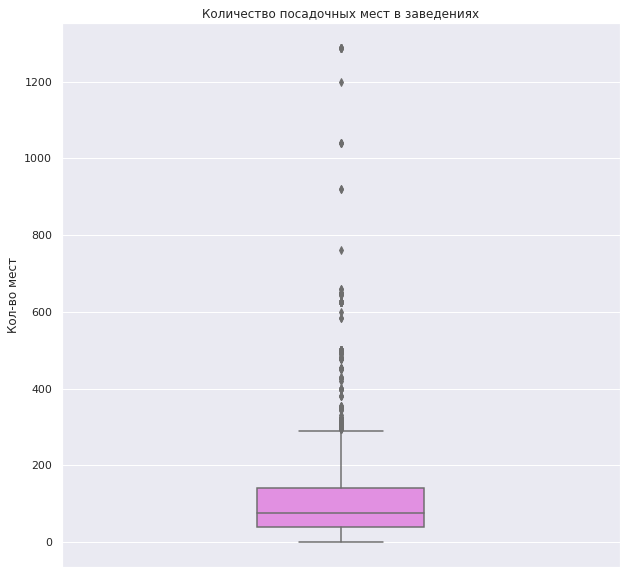

In [16]:
# построим ящик с усами для определения выбросов
sns.set(rc={"figure.figsize":(10, 10)})
sns.boxplot(data = filtered_df, y='seats', color='Violet', width=0.3)
plt.title('Количество посадочных мест в заведениях')
plt.ylabel('Кол-во мест')
plt.show()

Выбросов довольно много, нужно учитывать при последующем анализе, что после 250 посадочных мест уже начинаются выбросы

### Добавляем столбцы

In [17]:
# добавим столбец street
words = ['проезд','шоссе','улица','переулок','микрорайон','мкад','проспект','пр.',
         'площадь','аллея','бульвар','набережная','сквер','тупик','линия','территория', 'заказник',
         'квартал','просек', 'парк','мост', 'ул.']

str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))
 
filtered_df['street'] = filtered_df['address'].str.extract(str_pat, flags=re.I)

# проверим, что все добавилось
filtered_df['street']

0                 улица Дыбенко
1                 улица Дыбенко
2            Клязьминская улица
3       улица Маршала Федоренко
4           Правобережная улица
                 ...           
8401          Профсоюзная улица
8402      Пролетарский проспект
8403           Люблинская улица
8404           Люблинская улица
8405        Россошанский проезд
Name: street, Length: 8112, dtype: object

In [18]:
# проверим еще раз на пропуски
filtered_df['street'].isnull().sum()

127

In [19]:
# удаляем строки с пропусками в street, так как их не так много
filtered_df = filtered_df.dropna(subset=['street']).reset_index()
filtered_df['street'].isnull().sum()

0

In [20]:
# добавим столбец is_24/7
filtered_df['is_24/7'] = filtered_df['hours'].str.contains('ежедневно, круглосуточно')

In [21]:
filtered_df['is_24/7'].value_counts()

False    6917
True      685
Name: is_24/7, dtype: int64

In [22]:
print('В процессе очистки было удалено', round((len(df) - len(filtered_df)) / len(df) * 100, 2), '% строк')

В процессе очистки было удалено 5.01 % строк


**Что мы сделали на этом этапе:**
- перезаписали значения в столбце для сетевых/несетевых заведений
- заменили на 0 посадочные места в Яндекс.Лавке
- исследовали количество посадочных мест на предмет выбросов и удалили строки с аномально большими значениями
- добавили столбцы street и is_24/7

**Что мы можем сказать о датасете в целом после предобработки**:
- много неточностей в данных по аналогии с Яндекс.Лавкой, где заведению не соответствует ни категория, ни количество посадочных мест
- наверняка есть неявные дубликаты в названиях заведений, но их можно найти только в "ручном режиме", в данном случае придется с ними смириться
- много пробелов в данных, которые не представляется возможности заполнить. Несмотря на то, что можно заполнить средним значением по категории, мы считаем, что в категориях слишком большой разброс данных (например, рестораном может быть назван ресторан быстрого питания и там будет совершенно иной чек, чем в настоящем ресторане). Для сетевых заведений с пробелами в данных можно было бы взять значения других заведений этой же сети, но это нужно делать в "ручном режиме", что не совсем оптимально с точки зрения затрат времени
- нужно будет помнить, что неточности могут искажать результаты анализа

## Анализ данных

### Исследуем количество объектов общественного питания по категориям

In [23]:
# посмотрим, какие категории заведений представлены в данных
categories = filtered_df.groupby('category').agg({'category': ['count']})
categories.columns = ['count']

categories = categories.sort_values(['count'], ascending=False).reset_index()
categories

,category,count
0,кафе,2144
1,ресторан,1990
2,кофейня,1377
3,"бар,паб",758
4,пиццерия,628
5,быстрое питание,551
6,столовая,285
7,булочная,252


In [24]:
# построим круговую диаграмму
labels = categories['category']
values = categories['count']

fig = go.Figure(data=[go.Pie(labels=labels, values=values, title='Заведения по категориям')])
fig.show()

Итак, всего у нас 8 категорий:
- больше всего - кафе и ресторанов
- на кафе и рестораны приходится чуть больше половины всех заведений
- далее идут кофейни
- пиццерий и быстрого питания почти поровну
- меньше всего - булочных и столовых

### Исследуем количество посадочных мест в заведениях по категориям

In [25]:
# сделаем датафрейм и отфильтруем строки, в которых мы сделали маркер
seats_categories = filtered_df
seats_categories.head()

,index,name,total,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,0,WoWфли,1,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,несетевое,NaN,улица Дыбенко,False
1,1,Четыре комнаты,1,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,несетевое,4.0,улица Дыбенко,False
2,2,Хазри,1,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,несетевое,45.0,Клязьминская улица,False
3,3,Dormouse Coffee Shop,1,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,несетевое,NaN,улица Маршала Федоренко,False
4,4,Иль Марко,2,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,сетевое,148.0,Правобережная улица,False


In [26]:
# посмотрим на значения в разных категориях
seats_categories.groupby('category')['seats'].describe().sort_values(by='50%', ascending=False)

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
"бар,паб",468.0,124.532051,145.011574,0.0,48.0,82.5,150.00,1288.0
кофейня,749.0,111.405874,127.943465,0.0,40.0,80.0,144.00,1288.0
ресторан,1272.0,115.164308,119.947335,0.0,45.0,80.0,150.00,1288.0
столовая,150.0,103.933333,127.055802,0.0,40.0,80.0,120.00,1200.0
быстрое питание,328.0,100.990854,108.028949,0.0,30.0,70.0,144.75,1040.0
кафе,1145.0,99.627074,120.308075,0.0,36.0,60.0,120.00,1288.0
пиццерия,426.0,94.600939,112.393952,0.0,30.0,55.0,120.00,1288.0
булочная,148.0,89.385135,97.685844,0.0,25.0,50.0,120.00,625.0


In [27]:
# строим график
temp = seats_categories.groupby('category')\
                       .agg({'seats':'median'})\
                       .sort_values(by = 'seats', ascending = False)\
                       .reset_index()
fig = px.bar(temp, x='seats', y='category', color='category',labels={
                     'category': 'Категория заведения', 
                     'seats': 'Количество посадочных мест'
                     },title='Медианное количество посадочных мест в заведениях по категориям')

fig.show() 

- первое место с медианным значением чуть больше 80 посадочных мест занимают бары/пабы
- второе место с одинаковым медианным значением (80 посадочных мест) делят кофейни, рестораны и столовые
- на последних местах - булочные и пиццерии

### Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете

In [28]:
# рассмотрим соотношение сетевых и несетевых заведений
is_chained = filtered_df.groupby('chain').agg({'chain' : ['count']})
is_chained.columns = ['count']
is_chained = is_chained.reset_index()
is_chained

,chain,count
0,несетевое,4819
1,сетевое,3166


In [29]:
# строим график
labels = is_chained['chain']
values = is_chained['count']

fig = go.Figure(data=[go.Pie(labels=labels, values=values, title='Соотношение сетевых и несетевых заведений')])
fig.show()

- Из графика следует вывод, что сетевых заведений в датасете больше, на них приходится 60.4%. Несетевых заведений 39.6%

### Исследуем категории сетевых заведений

In [30]:
# введем переменную с сетевыми заведениями
chained_categories = filtered_df.groupby(['category', 'chain'], as_index=False)['name'].count().sort_values(by='name')

# соединим таблицы
share_chain = pd.merge(chained_categories, categories, on=['category'], how='left')
share_chain['share'] = round(share_chain['name'] / share_chain['count'] * 100, 2)
share_chain

,category,chain,name,count,share
0,булочная,несетевое,95,252,37.70
1,столовая,сетевое,96,285,33.68
2,булочная,сетевое,157,252,62.30
3,"бар,паб",сетевое,164,758,21.64
4,столовая,несетевое,189,285,66.32
5,быстрое питание,сетевое,228,551,41.38
6,пиццерия,несетевое,303,628,48.25
7,быстрое питание,несетевое,323,551,58.62
8,пиццерия,сетевое,325,628,51.75
9,"бар,паб",несетевое,594,758,78.36


In [31]:
# визуализируем
fig = px.bar(share_chain, x='category', y='name', color='chain', text='share')
fig.update_layout(
    title="Распределение сетевых и несетевых заведений",
    xaxis_title="Категория",
    yaxis_title="Количество"
    )
fig.show()

Итак, что мы здесь видим:
- самую большую долю сетевых заведений составляют кафе
- далее идут идут рестораны и кофейни
- меньше всего среди сетевых заведений столовых
- булочные и кофейни, как парвило, сетевые
- в целом, обычно больше несетевых заведений, чем сетевых

### Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве

In [32]:
# посмотрим на самые популярные категории из топ-15 сетей
top_15 = filtered_df.loc[(filtered_df['chain'] == 'сетевое')]\
                       .groupby('name')\
                       .agg({'total' : 'count', 'category' : pd.Series.mode})\
                       .sort_values('total', ascending = False)\
                       .reset_index()\
                       .rename(columns={"total": "total_places"})\
                       .head(15) 
top_15

,name,total_places,category
0,Шоколадница,120,кофейня
1,Домино'с Пицца,76,пиццерия
2,Додо Пицца,74,пиццерия
3,One Price Coffee,71,кофейня
4,Яндекс Лавка,69,ресторан
5,Cofix,65,кофейня
6,Prime,50,ресторан
7,Хинкальная,44,кафе
8,КОФЕПОРТ,42,кофейня
9,Теремок,38,ресторан


Все бренды довольно узнаваемые. Теперь посмотрим на распределение по категориям:

In [33]:
# визуализируем
labels = top_15['category']
fig = go.Figure(data=[go.Pie(labels=labels, title='Распределение топ-15 сетевых заведений по категориям')])
fig.show()

Еще раз немного иначе визуализируем, какие заведения чаще всего являются сетевыми:

In [34]:
# строим график
fig = px.bar(top_15, x='category', color="category", labels={
                     'category': 'Категория заведения', 
                     'total_places': 'Количество заведений разных сетей',
                     'count' : 'Количество заведений'
                     },title='Количество заведений разных сетей в каждой категории топ-15 сетей')

fig.show() 

- можно сделать вывод, что из топ-15 сетей в основном преобладают кофейни (5 разных сетей из топ-15) и кафе (5 разных сетей из топ-15)
- меньше всего - булочных, в топ-15 вошла только одна сеть

Отобразим общее количество заведений из топ-15 и количество заведений каждой категории по районам.
Общее количество заведений в каждой категории из топ-15:

In [35]:
# создадим переменную
top_15_total = top_15.groupby('category')['total_places'].sum().to_frame().reset_index()
top_15_total

,category,total_places
0,булочная,32
1,кафе,145
2,кофейня,329
3,пиццерия,150
4,ресторан,157


In [36]:
# строим график
fig = px.bar(top_15_total, x='category', y='total_places', color="category", labels={
                     'category': 'Категория заведения', 
                     'count': 'Количество заведений'
                     },title='Общее кол-во заведений в каждой категории из топ-15 сетей')

fig.show() 

- больше всего в датасете представлены кофейни, причем с огромным отрывом: их в 2 раза больше, чем ресторанов, пиццерий и кафе
- ресторанов, пиццерий и кафе почти поровну
- меньше всего – булочных

Посмотрим на количество заведений каждой категории из топ-15 по районам

In [37]:
# сделаем список с названиями популярных сетей
names_top_15 = top_15['name']

# сделаем табличку, куда войдут только эти сети
top_15_by_districts = filtered_df.loc[filtered_df['name'].isin(names_top_15)]
top_15_by_districts = top_15_by_districts.groupby(['district', 'category'])['name'].count().to_frame().reset_index()
top_15_by_districts.columns = ['district', 'category', 'total_places']
top_15_by_districts.head(5)

,district,category,total_places
0,Восточный административный округ,"бар,паб",2
1,Восточный административный округ,булочная,1
2,Восточный административный округ,быстрое питание,2
3,Восточный административный округ,кафе,6
4,Восточный административный округ,кофейня,30


In [38]:
# визуализируем
fig = px.bar( top_15_by_districts, y='district',  x='total_places', color="category", barmode='group', labels={
                     'district': 'Район',
                     'count': 'Количество заведений',
                     'category': 'Категория',
                     'total_places': 'Количество сетей'
                     },title='Общее кол-во заведений из топ-15 сетей в каждой категории по районам')

fig.show() 

Если смотреть на распределение топ-15 сетей по районам:
- абсолютно везде преобладают кофейни, причем с заметным отрывом
- больше всего заведений, как и ожидалось, в центре. В центре много кофеен, ресторанов и кафе. Пиццерий в центре меньше, чем в остальных районах 
- почти везде, кроме ЦАО, пиццерии занимают второе место по распространенности
- интересно, что есть отдельные районы, где существенно больше булочных, чем в остальных районах – это САО, СВАО, ЗАО и СЗАО
- пабы представлены только в ВАО, ЦАО и ЮЗАО
- столовые есть только в ЦАО и ВАО
- в ЮАО и САО нет сетей быстрого питания 

И еще раз вспомним о том, что неточности в данных могут влиять на реальную картину. 

### Исследуем распределение всех заведений по районам

In [39]:
# вспомогательная табличка с разбивкой по категориям
temp2 = filtered_df.groupby(['district', 'category'])\
                       .agg({'name' : 'count'})\
                       .reset_index()\
                       .rename(columns={"name": "count"})

# вспомогательная табличка с общим кол-вом заведений
temp3 = temp2.groupby('district')['count'].sum().to_frame().reset_index()
temp3.columns = ['district', 'total']

#переменная для заведений по районам
districts_categories = pd.merge(temp2, temp3, on=['district'], how='left')
districts_categories

,district,category,count,total
0,Восточный административный округ,"бар,паб",51,736
1,Восточный административный округ,булочная,25,736
2,Восточный административный округ,быстрое питание,64,736
3,Восточный административный округ,кафе,233,736
4,Восточный административный округ,кофейня,103,736
...,...,...,...,...
67,Южный административный округ,кафе,238,850
68,Южный административный округ,кофейня,129,850
69,Южный административный округ,пиццерия,73,850
70,Южный административный округ,ресторан,196,850


In [40]:
# визуализируем
fig = px.bar( districts_categories, y='district',  x='count', color="category", barmode='stack', labels={
                     'district': 'Район', 'count': 'Количество заведений', 'category': 'Категория'
                     },title='Общее кол-во заведений в каждой категории по районам')

fig.update_layout(yaxis={'categoryorder':'total descending'})
fig.show() 

Как распределяются все заведения по районам:
- по количеству заведений опять лидирует ЦАО, а вот меньше всего заведений – в СЗАО
- ситуация с кофейнями – не такая, как в распределении топ-15 сетевых заведений
- в ЦАО больше всего ресторанов, потом почти поровну кафе и кофейни. Также в ЦАО больше всего баров, причем существенно. Меньше всего – булочных и столовых
- столовых везде мало, особенно в ЮЗАО - там их всего 14
- пиццерий и быстрого питания во всех районах примерно одно количество
- в СЗАО почти нет баров и меньше всего булочных
- в целом, во всех районах лидирует триада "кафе-ресторан-кофейня" в разных пропорциях

### Посмотрим на распределение средних рейтингов по категориям заведений

In [41]:
ratings_by_categories = filtered_df.groupby('category')['rating'].mean().round(3).sort_values(ascending=False)\
                       .to_frame().reset_index()
ratings_by_categories

,category,rating
0,"бар,паб",4.390
1,пиццерия,4.301
2,ресторан,4.291
3,кофейня,4.279
4,булочная,4.273
5,столовая,4.208
6,кафе,4.143
7,быстрое питание,4.058


In [42]:
# строим график
fig = px.bar(ratings_by_categories, x='category', y='rating', color="category", labels={
                     'category': 'Категория заведения', 'rating' : 'Рейтинг'
                     },title='Распределение рейтингов по категориям')

fig.update_yaxes(range=[4, 4.4])
fig.show() 

- средние рейтинги довольно высокие, нигде нет рейтингов ниже 4, но и выше 4.4 их тоже нет
- самые высокие средние рейтинги – у баров. Интересно, связано ли это с хорошим настроением во время употребления алкоголя (или потому, что люди там обычно хорошо проводят время и у них остаются приятные впечатления о заведениях)
- самые плохие рейтинги – у быстрого питания, это тоже объяснимо

### Посмотрим на средний рейтинг заведений каждого района

In [43]:
# положим все данные в отдельную таблицу
ratings_by_district = filtered_df.groupby('district')['rating'].mean().round(3).sort_values(ascending=False) \
                        .to_frame().reset_index()
ratings_by_district

,district,rating
0,Центральный административный округ,4.379
1,Северный административный округ,4.255
2,Северо-Западный административный округ,4.219
3,Западный административный округ,4.192
4,Восточный административный округ,4.190
5,Южный административный округ,4.190
6,Юго-Западный административный округ,4.181
7,Северо-Восточный административный округ,4.158
8,Юго-Восточный административный округ,4.107


In [44]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

In [45]:

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=ratings_by_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.5,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)


m

- рейтингов ниже 4 и выше 4.4 также нет
- заведения с самыми высокими рейтингами находятся в ЦАО, оно и понятно: здесь много дорогих и хороших заведений
- чуть пониже рейтинги у СВАО, в районе Сокола/Аэропорта много престижного жилья, и заведения питания там попадаются соответствующие
- в ЮВАО рейтинги ниже всего, это довольно недорогой район, здесь заведения попроще, что не может не влиять на рейтинг

### Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium

In [46]:
# импортируем карту и маркер
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

- тут, опять же, очевидно, что в центре заведений – больше всего

### Найдем топ-15 улиц по количеству заведений

In [47]:
# найдем топ-15 улиц по количеству заведений
streets_names = filtered_df.groupby('street')\
                       .agg({'name' : 'count'})\
                       .rename(columns={'name': 'total'})\
                       .sort_values(by='total',ascending=False)\
                       .reset_index()\
                       .head(15)
streets_names

,street,total
0,проспект Мира,182
1,Профсоюзная улица,116
2,проспект Вернадского,106
3,Ленинский проспект,106
4,Ленинградский проспект,94
5,Дмитровское шоссе,85
6,Каширское шоссе,75
7,Варшавское шоссе,73
8,Ленинградское шоссе,69
9,Люблинская улица,56


In [48]:
# визуализируем
fig = px.bar(streets_names, y='street',  x='total', color="street", barmode='stack', labels={
                     'street': 'Улица', 
                     'total': 'Количество заведений'
                     },title='Общее кол-во заведений по улицам')

fig.show()

Тут, наверное, все-таки было бы еще интересно посмотреть на плотность заведений на 1 км улицы, потому что сейчас информация не совсем полноценная. 

Например, мы видим, что первое место занимает проспект Мира, ради интереса мы посмотрели его длину – почти 9 км. Та же ситуация с Профсоюзной улицей и проспектом Вернадского и Ленинским проспектом – он вообще 16 км. Для сравнения, длина Пятницкой - почти 2 км, то есть в 8 раз меньше, а заведений там всего в 2 раза меньше, потому что их плотность очень высокая. 

In [49]:
# положим названия улиц в отдельный список
streets_top_15_names = streets_names['street']

# сделаем разделение по категориям
streets_top_15 = filtered_df.loc[filtered_df['street'].isin(streets_top_15_names)]
streets_top_15 = streets_top_15.groupby(['street', 'category'])['name'].count().to_frame().reset_index()
streets_top_15.columns = ['street', 'category', 'count']
streets_top_15

,street,category,count
0,Варшавское шоссе,"бар,паб",6
1,Варшавское шоссе,быстрое питание,7
2,Варшавское шоссе,кафе,16
3,Варшавское шоссе,кофейня,14
4,Варшавское шоссе,пиццерия,4
...,...,...,...
105,улица Миклухо-Маклая,быстрое питание,4
106,улица Миклухо-Маклая,кафе,20
107,улица Миклухо-Маклая,кофейня,4
108,улица Миклухо-Маклая,пиццерия,2


In [50]:
# визуализируем разбивку по категориям
fig = px.scatter(
    streets_top_15,
    x='street',
    y='category',
    size='count',
    color='category',
    text='count'
      )

fig.update_xaxes(
    tickangle=90
)

fig.update_traces(
    textposition="bottom center",
    textfont_size=10
)

fig.update_layout(
    title='Распределение заведений по популярным улицам',
    xaxis_title='Улица',
    yaxis_title='Категория',
    width=980,
    height=600,
    template="plotly_white"
)

fig.show()

- На популярных улицах больше всего кафе, ресторанов и кофеен
- На некоторых популярных улицах вообще нет столовых/булочных/пиццерий
- На Пятницкой – меньше всего кафе, а вот баров больше, чем кафе (такая же ситуация с Ленинградским проспектом)

### Найдем улицы, на которых находится только один объект общепита

In [51]:
# найдем улицы с одним заведением
one_place_streets = filtered_df.groupby('street')\
                       .agg({'name' : 'count'})\
                       .rename(columns={'name': 'total'})\
                       .sort_values(by='total',ascending=True)\
                       .reset_index()

one_place_streets = one_place_streets.loc[one_place_streets['total'] == 1]
one_place_streets

,street,total
0,1-й Автозаводский проезд,1
1,Новопоселковая улица,1
2,Новороссийская улица,1
3,Новосущёвская улица,1
4,Новощукинская улица,1
...,...,...
417,2-й Вышеславцев переулок,1
418,2-й Кожуховский проезд,1
419,1-й Вешняковский проезд,1
420,Булатниковский проезд,1


Улиц с одним заведением общепита 422 штуки, было бы интересно взглянуть на расположение этих заведений

In [52]:
# сделаем список с названиями таких улиц
one_place_names = one_place_streets['street']

# создадим датасет one_place_locations, куда войдет вся информация об улицах с одним заведением
one_place_locations = filtered_df.loc[filtered_df['street'].isin(one_place_names)]
one_place_locations

,index,name,total,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
15,15,Дом обеда,1,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,несетевое,180.0,улица Бусиновская Горка,False
21,21,7/12,1,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,несетевое,NaN,Прибрежный проезд,False
54,58,Coffeekaldi's,8,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,сетевое,NaN,Угличская улица,False
65,71,CofeFest,32,кофейня,"Москва, Новгородская улица, 23А",Северо-Восточный административный округ,пн-пт 08:00–19:00,55.901799,37.577672,4.1,NaN,NaN,NaN,NaN,сетевое,NaN,Новгородская улица,False
90,97,Жигулевское,1,"бар,паб","Москва, Бибиревская улица, 7к2",Северо-Восточный административный округ,"пн-чт 14:00–00:00; пт,сб 14:00–02:00; вс 14:00...",55.879733,37.593734,4.5,средние,Цена бокала пива:90–230 ₽,NaN,NaN,несетевое,NaN,Бибиревская улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7875,8294,WTFcoffee,1,кофейня,"Москва, улица Артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,несетевое,NaN,улица Артюхиной,False
7880,8299,Шашлычный рай,1,кафе,"Москва, Юго-Восточный административный округ, ...",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.721304,37.733848,4.1,NaN,NaN,NaN,NaN,несетевое,NaN,квартал 90А Грайвороново,False
7898,8317,Беседка,2,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,сетевое,NaN,Кузьминская улица,False
7959,8379,Лагман Хаус,3,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,сетевое,40.0,Новороссийская улица,False


In [53]:
# посмотрим на карту

# moscow_lat - широта, moscow_lng – долгота
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(m)

# применяем функцию для создания маркера ко всем строкам датафрейма
one_place_locations.apply(create_marker, axis=1)
    
# выводим карту
m

- улиц с одним заведением много, они разбросаны по всей Москве, но больше всего таких улиц в центре
- по карте видно, что это либо маленькие улицы, либо всякие промышленные территории

### Исследуем значения средних чеков

In [54]:
# посмотрим на разбивку по районам
bills = filtered_df.groupby('district', as_index=False)['middle_avg_bill']\
                   .agg('median')\
                   .sort_values(by='middle_avg_bill', ascending=False)
bills

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,725.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,650.0
0,Восточный административный округ,600.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [55]:
# построим хороплет

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=bills,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

# выводим карту
m

- тут напрашивается очевидный и логичный вывод: чем ближе к центру, тем цены выше
- интересная ситуация с Западным округом: медианные цены в нем такие же, как и в центре, но в этом округе находится много элитного жилья, где живут обеспеченные люди - разумеется, это не может не отражаться на заведениях общественного питания
- также мы видим "анклав" во Внуково, потому что в аэропортах цены традиционно выше, чем в заведениях в городе

## Детализируем исследование: открытие кофейни

### Посмотрим, сколько всего кофеен в датасете

In [56]:
coffee_shops = filtered_df[filtered_df['category'] == 'кофейня'].reset_index(drop=True)
coffee_shops.head()

,index,name,total,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,3,Dormouse Coffee Shop,1,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,несетевое,NaN,улица Маршала Федоренко,False
1,45,9 Bar Coffee,7,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,сетевое,46.0,Коровинское шоссе,False
2,46,CofeFest,32,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,сетевое,NaN,улица Маршала Федоренко,False
3,52,Cofix,65,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,сетевое,NaN,улица Дыбенко,False
4,53,Royal Coffee,1,кофейня,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.880622,37.448529,3.1,NaN,NaN,NaN,NaN,несетевое,148.0,Правобережная улица,False


In [57]:
len(coffee_shops)

1377

Всего у нас 1377 кофеен в датасете. 

### Посмотрим на особенности их расположения

In [58]:
# сгруппируем их по районам
coffee_districts = coffee_shops.groupby('district')['name']\
                                .count()\
                                .to_frame()\
                                .sort_values(by='name', ascending=False)\
                                .reset_index()
coffee_districts.columns = ['district', 'total']
coffee_districts

,district,total
0,Центральный административный округ,426
1,Северный административный округ,185
2,Северо-Восточный административный округ,151
3,Западный административный округ,145
4,Южный административный округ,129
5,Восточный административный округ,103
6,Юго-Западный административный округ,93
7,Юго-Восточный административный округ,86
8,Северо-Западный административный округ,59


In [59]:
# визуализируем
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_districts,
    columns=['district', 'total'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.8,
    legend_name='Распределение кофеен по районам',
).add_to(m)

# выводим карту
m

- логично, что больше всего кофеен в центре
- в САО, СВАО, ЗАО и ЮАО кофеен примерно одинаковое количество
- меньше всего кофеен в ВАО, ЮВАО, ЮЗАО и СЗАО

In [60]:
# создадим датасет one_place_no_coffee, куда войдет вся информация об улицах с одним заведением (и чтобы это не была кофейня)
one_place_no_coffee = filtered_df.loc[filtered_df['street'].isin(one_place_names)]
one_place_no_coffee = one_place_no_coffee[one_place_no_coffee['category'] != 'кофейня']
one_place_no_coffee.head()

,index,name,total,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
15,15,Дом обеда,1,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,несетевое,180.0,улица Бусиновская Горка,False
21,21,7/12,1,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,несетевое,NaN,Прибрежный проезд,False
90,97,Жигулевское,1,"бар,паб","Москва, Бибиревская улица, 7к2",Северо-Восточный административный округ,"пн-чт 14:00–00:00; пт,сб 14:00–02:00; вс 14:00...",55.879733,37.593734,4.5,средние,Цена бокала пива:90–230 ₽,NaN,NaN,несетевое,NaN,Бибиревская улица,False
96,103,Тетри,1,быстрое питание,"Москва, Лианозовский проезд, вл1",Северо-Восточный административный округ,вт-вс 09:00–19:00,55.896922,37.554929,4.0,средние,Средний счёт:150–250 ₽,200.0,NaN,несетевое,NaN,Лианозовский проезд,False
103,111,Алазани,1,ресторан,"Москва, Челобитьевское шоссе, 10А",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.914074,37.556803,4.3,выше среднего,Средний счёт:600–2000 ₽,1300.0,NaN,несетевое,40.0,Челобитьевское шоссе,False


In [61]:
# посмотрим на карту

# moscow_lat - широта, moscow_lng – долгота
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(m)

# применяем функцию для создания маркера ко всем строкам датафрейма
one_place_no_coffee.apply(create_marker, axis=1)
    
# выводим карту
m

Отлично, эти данные помогут нам в будущем, когда будем определять подходящее место для открытия кофейни. 

### Посмотрим, есть ли круглосуточные кофейни

In [62]:
coffee_shops.loc[coffee_shops['is_24/7'] == True]

,index,name,total,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
23,200,Wild Bean,6,кофейня,"Москва, Дмитровское шоссе, 107Е",Северный административный округ,"ежедневно, круглосуточно",55.878477,37.543426,3.5,NaN,NaN,NaN,NaN,сетевое,20.0,Дмитровское шоссе,True
137,971,Wild Bean Cafe,13,кофейня,"Москва, Ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.867822,37.708853,4.0,NaN,NaN,NaN,NaN,сетевое,25.0,Ярославское шоссе,True
153,1047,Wild Bean Cafe,13,кофейня,"Москва, Ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.851778,37.676423,4.5,NaN,Цена чашки капучино:140–200 ₽,NaN,170.0,сетевое,NaN,Ярославское шоссе,True
174,1214,Wild Bean Cafe,13,кофейня,"Москва, МКАД, 65-й километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.813787,37.390701,4.3,NaN,NaN,NaN,NaN,сетевое,NaN,МКАД,True
186,1291,Шоколадница,120,кофейня,"Москва, улица Народного Ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.794815,37.494834,4.2,средние,Средний счёт:650–850 ₽,750.0,NaN,сетевое,200.0,улица Народного Ополчения,True
222,1468,Кофе Хауз,5,кофейня,"Москва, Ленинградский проспект, 74",Северный административный округ,"ежедневно, круглосуточно",55.805239,37.516246,4.0,NaN,Цена чашки капучино:235–335 ₽,NaN,285.0,сетевое,NaN,Ленинградский проспект,True
293,1790,Кофемания,23,кофейня,"Москва, Ленинградский проспект, 37А, корп. 14,...",Северный административный округ,"ежедневно, круглосуточно",55.790899,37.542776,4.7,NaN,NaN,NaN,NaN,сетевое,15.0,Ленинградский проспект,True
301,1825,You&coffee,2,кофейня,"Москва, улица Золоторожский Вал, 11, стр. 21",Северный административный округ,"ежедневно, круглосуточно",55.803924,37.582251,4.2,NaN,NaN,NaN,NaN,сетевое,NaN,улица Золоторожский Вал,True
316,1883,Кофемания,23,кофейня,"Москва, Лесная улица, 5",Центральный административный округ,"ежедневно, круглосуточно",55.777804,37.586346,4.4,высокие,Средний счёт:2000 ₽,2000.0,NaN,сетевое,140.0,Лесная улица,True
358,2030,Cinnabon,20,кофейня,"Москва, Долгоруковская улица, 40",Центральный административный округ,"ежедневно, круглосуточно",55.778271,37.601991,4.2,NaN,NaN,NaN,NaN,сетевое,230.0,Долгоруковская улица,True


In [63]:
coffeeshops_24_7 = coffee_shops[coffee_shops['is_24/7'] == True]

# moscow_lat - широта, moscow_lng – долгота
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(m)

# применяем функцию для создания маркера ко всем строкам датафрейма
coffeeshops_24_7.apply(create_marker, axis=1)
    
# выводим карту
m

Да, круглосуточные кофейни имеются, за пределами центра довольно большая часть из них находится на заправках. 

У нас обнаружились дубликаты, так как **Wild Bean Cafe**, **Wild Bean** и **The wild bean cafe** – это наверняка одна сеть. 

### Посмотрим на рейтинги и как они распределяются по районам

In [64]:
coffee_ratings = coffee_shops.groupby('district', as_index=False)['rating']\
                             .agg('median')\
                             .sort_values(by='rating', ascending=False)
coffee_ratings

,district,rating
0,Восточный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
6,Юго-Восточный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
1,Западный административный округ,4.2


In [65]:
# визуализируем
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_ratings,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

- рейтинг везде примерно одинаковый (в районе 4.30), кроме ЗАО. Интересно, что могло на это повлиять

### Исследуем, на какую стоимость чашки капучино стоит ориентироваться при открытии и почему

In [66]:
# посмотрим на стоимость чашки кофе
coffee_shops['middle_coffee_cup'].describe()

count     520.000000
mean      175.065385
std        89.839160
min        60.000000
25%       124.000000
50%       169.500000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

- Минимальная цена: 60 рублей, это наверняка какая-то недорогая кофейня типа Cofix 
- Максимальная цена: 1568 рублей, немного смущает такая цифра, еще и с точностью до рубля. Посмотрим поближе

In [67]:
coffee_shops[coffee_shops['middle_coffee_cup'] == 1568]

,index,name,total,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
514,2859,Шоколадница,120,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,сетевое,48.0,Большая Семёновская улица,False


В Шоколаднице не может быть такой стоимости чашки кофе, видимо, это ошибка ручного ввода. Скорее всего, в столбце avg_bill имелось в виду, что цена чашки от 230 до 290 рублей. Исключим эту строку из данных и посмотрим на среднюю стоимость еще раз. 

In [68]:
coffee_shops = coffee_shops.loc[coffee_shops['middle_coffee_cup'] != 1568]
coffee_shops['middle_coffee_cup'].describe()

count    519.000000
mean     172.381503
std       65.831223
min       60.000000
25%      124.000000
50%      169.000000
75%      225.000000
max      375.000000
Name: middle_coffee_cup, dtype: float64

In [69]:
# сгруппируем данные по районам
coffee_cup_price = coffee_shops.groupby('district')['middle_coffee_cup']\
                                .median()\
                                .to_frame()\
                                .sort_values(by='middle_coffee_cup', ascending=False)\
                                .reset_index()
coffee_cup_price.columns = ['district', 'middle_coffee_cup']
coffee_cup_price

,district,middle_coffee_cup
0,Юго-Западный административный округ,198.0
1,Центральный административный округ,190.0
2,Западный административный округ,189.0
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,160.0
5,Северный административный округ,159.0
6,Южный административный округ,150.0
7,Юго-Восточный административный округ,147.5
8,Восточный административный округ,135.0


In [70]:
# визуализируем
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_cup_price,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.8,
    legend_name='Средняя цена чашки кофе по районам',
).add_to(m)

# выводим карту
m

- Самый дорогой кофе у нас в центре и в ЮЗАО, самый дешевый - в ВАО

**Рекомендации по открытию кофейни:**
Нам нужно открыть доступную кофейню, в которой можно посидеть с друзьями. 

На минимальную цену чашки кофе ориентироваться не будем, потому что для такой низкой цены приходится урезать затраты (маленькое помещение без посадочных мест, отсутствие официантов, самый простой дизайн) - а это не выглядит как место, в котором хочется пообщаться с друзьями. 

Мы бы ориентировались на среднюю цену и выше, например, от 170 до 200 рублей, окончательный выбор стоимость чашки кофе зависит от множества факторов, в том числе и от района расположения кофейни. 

Где можно открыть:

1. В центре города. В центре города много кофеен, выше средний чек и больше конкуренция, тем не менее, в центре есть много улиц только с одним заведением общепита, и при этом это заведение не является кофейней. Конечно, надо еще исследовать проходимость этих улиц (а также не отходит ли эта улица от крупной "ресторанной" улицы), но в целом идея выглядит достаточно привлекательно, можно обратить внимание на улицы, близкие к паркам и скверам. Например, на 2-й Щемиловский переулок рядом с Делегатским парком, или на 1-й Новокузнецкий переулок
2. В ЮЗАО, потому что цены там как в ЦАО, а вот конкуренции поменьше
3. Можно также рассмотреть ВАО, потому что там самое низкое число кофеен (то есть конкуренция), и открытие хорошей кофейни не помешает. Плюс к тому, в спальных районах обычно ниже аренда, что тоже приятно. Из минусов может быть то, что, по условиям задания мы хотим открыть кофейню для посиделок, а в спальных районах друзья обычно не собираются (потому что все живут в разных местах и встречаются в центре).

# Выводы проекта:

**Еще раз вспомним о том, что неточности в данных могут влиять на реальную картину. Приступим к выводам**

**Категории**: 
- 8 категорий заведений: кафе, рестораны, бары/пабы, кофейни, булочные, столовые, заведения быстрого питания, пиццерии
- больше всего - кафе и ресторанов, на них приходится чуть больше половины всех заведений
- далее идут кофейни
- пиццерий и быстрого питания почти поровну
- меньше всего - булочных и столовых

**Посадочные места:**
- первое место с медианным значением чуть больше 80 посадочных мест занимают бары/пабы
- второе место с одинаковым медианным значением (80 посадочных мест) делят кофейни, рестораны и столовые
- на последних местах - булочные и пиццерии

**Распределение сетевых и несетевых заведений:**
- несетевых заведений 60.4%
- сетевых заведений 39.6%
- несетевых заведений у нас больше, чем сетевых, на 20.8%

**Распределение сетевых заведений по по долям:**
- самую большую долю сетевых заведений составляют кафе
- далее идут идут рестораны и кофейни
- меньше всего среди сетевых заведений столовых
- булочные и кофейни, как парвило, сетевые
- в целом, обычно больше несетевых заведений, чем сетевых

**Топ-15 сетей по категориям:**
- больше всего в датасете представлены кофейни, причем с огромным отрывом: их в 2 раза больше, чем ресторанов, пиццерий и кафе
- ресторанов, пиццерий и кафе почти поровну
- меньше всего – булочных

**Топ-15 сетей по районам:**
- везде преобладают кофейни с заметным отрывом
- больше всего заведений в центре – там много кофеен, ресторанов и кафе. Пиццерий в центре меньше, чем в остальных районах 
- почти везде, кроме ЦАО, пиццерии занимают второе место по распространенности
- есть отдельные районы, где существенно больше булочных, чем в остальных районах – это САО, СВАО, ЗАО и СЗАО
- пабы представлены только в ВАО, ЦАО и ЮЗАО
- столовые есть только в ЦАО и ВАО
- в ЮАО и САО нет сетей быстрого питания 

**Все заведения. Распределение по районам:**
- по количеству заведений лидирует ЦАО, меньше всего заведений – в СЗАО
- в ЦАО больше всего ресторанов, потом почти поровну кафе и кофейни. Также в ЦАО больше всего баров. Меньше всего – булочных и столовых
- столовых везде мало, особенно в ЮВАО
- пиццерий и быстрого питания во всех районах примерно одно количество
- в СЗАО почти нет баров и меньше всего булочных
- во всех районах лидирует триада "кафе-ресторан-кофейня" в разных пропорциях

**Все заведения. Рейтинги:**
- нигде нет средних рейтингов ниже 4, но и выше 4.4 их тоже нет
- самые высокие средние рейтинги – у баров
- самые плохие рейтинги – у быстрого питания

**Все заведения. Рейтинги по районам:**
- рейтингов ниже 4 и выше 4.4 также нет
- заведения с самыми высокими рейтингами находятся в ЦАО
- чуть пониже рейтинги у СВАО
- в ЮВАО рейтинги ниже всего


**Топ-15 улиц по количеству заведений:**
- в вершине списка протяженные улицы от 9 км, проспект Мира, Профсоюзная, Ленинский проспект
- внизу списка коротнкие улицы с большой плотностью заведений, например, Пятницкая

**Категории заведений на топ-15 улиц:**
- на популярных улицах больше всего кафе, ресторанов и кофеен
- на некоторых популярных улицах вообще нет столовых/булочных/пиццерий
- на Пятницкой – меньше всего кафе, а вот баров больше, чем кафе (такая же ситуация с Ленинградским проспектом)

**Улицы с одним заведением:**
- улиц с одним заведением много, они разбросаны по всей Москве, но больше всего таких улиц в центре
- по карте видно, что это либо маленькие улицы, либо промышленные территории

**Средний чек:**
- чем ближе к центру, тем цены выше
- в ЗАО такие же медианные цены, как и в ЦАО


**Кофейни:**
- всего у нас 1377 кофеен в датасете
- больше всего кофеен в центре
- в САО, СВАО, ЗАО и ЮАО кофеен примерно одинаковое количество
- меньше всего кофеен в ВАО, ЮВАО, ЮЗАО и СЗАО
- круглосуточные кофейни имеются, за пределами центра довольно большая часть из них находится на заправках
- обнаружились дубликаты,  **Wild Bean Cafe**, **Wild Bean** и **The wild bean cafe** – это наверняка одна сеть

**Кофейни. Рейтинг:**
- рейтинг по районам везде примерно одинаковый (4.28-4.30), кроме ЗАО (4.20-4.22)

**Кофейни. Средний чек:**
- минимальная цена: 60 рублей
- средняя цена: 170 рублей
- максимальная цена: 375 рублей

**Вывод по кофейням:**
- мы бы ориентировались на среднюю цену и выше, например, от 170 до 200 рублей, окончательный выбор стоимость чашки кофе зависит от множества факторов, в том числе и от района расположения кофейни
- район расположения предлагаем в ЦАО на пустых улицах, ЗАО или СЗАО

# Презентация

Ссылка на презентацию: https://disk.yandex.ru/i/KkCMjqE0EGBBhg 